In [177]:
import pandas as p 
import numpy as n 
import matplotlib.pyplot as mtp 
import seaborn as s 
import plotly.express as px 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import cross_val_score


In [29]:
data = p.read_csv("annual-change-in-average-male-height.csv")

In [30]:
data.head()

,Entity,Code,Year,Mean male height (cm),Mean female height (cm),Year-on-year change in female height (%),Year-on-year change in male height (%),Population (historical estimates),Daily caloric intake per person that comes from animal protein
0,Afghanistan,AFG,1896.0,161.164095,149.187747,0.08962,0.01997,NaN,NaN
1,Afghanistan,AFG,1897.0,161.196286,149.321451,0.08977,0.01986,10694804.0,55.128870
2,Afghanistan,AFG,1898.0,161.228297,149.455494,0.08966,0.02011,10745168.0,54.959705
3,Afghanistan,AFG,1899.0,161.260727,149.589503,0.08963,0.02005,12057436.0,57.932200
4,Afghanistan,AFG,1900.0,161.293068,149.723587,0.08949,0.02010,14003764.0,58.493233


In [31]:
data.shape

(59623, 9)

In [32]:
nan = data.isnull().sum()
print(nan)

Entity                                                            38615
Code                                                              39322
Year                                                              38615
Mean male height (cm)                                             38615
Mean female height (cm)                                           38615
Year-on-year change in female height (%)                          38823
Year-on-year change in male height (%)                            38823
Population (historical estimates)                                  1371
Daily caloric intake per person that comes from animal protein    47263
dtype: int64


In [77]:
datanonull = data.dropna()

In [33]:
uq = data['Code'].nunique()
uq

201

A animated Map of the world representing hte change of mean heights throughout eveery country , this uses plotly choropletht and animation_frame for the animation of these sequence . This represents the MALE HEight 

In [34]:
male_map = px.choropleth(
    data , 
    locations= "Code" , 
    locationmode= "ISO-3" , 
    hover_name= "Code" ,
    animation_frame= "Year" , 
    color='Mean male height (cm)'
)

In [ ]:
male_map.upate_layout(
    height =800 ,
    width = 1500 , 
    margin = dict(l=0 , r = 0 , t = 30 , b = 0 )
)
male_map.upate_layout(
    title_text='Mean Male Heights By Country And Year'
    ,title_font_family='Consolas')
male_map

A animated Map of the world representing hte change of mean heights throughout eveery country , this uses plotly choropletht and animation_frame for the animation of these sequence . This represents the FEMALE HEight 

In [37]:
female_map = px.choropleth(
    data , 
    locations= "Code" , 
    locationmode= "ISO-3" , 
    hover_name= "Code" ,
    animation_frame= "Year" , 
    color='Mean female height (cm)',
    color_continuous_scale="blues"
)

In [ ]:
female_map.upate_layout(
    height =800 ,
    width = 1500 , 
    margin = dict(l=0 , r = 0 , t = 30 , b = 0 )
)
female_map.upate_layout(
    title_text='Mean Male Heights By Country And Year'
    ,title_font_family='Consolas')
female_map

THis shows the Heatmap for the cpuntires average height throughout the years 

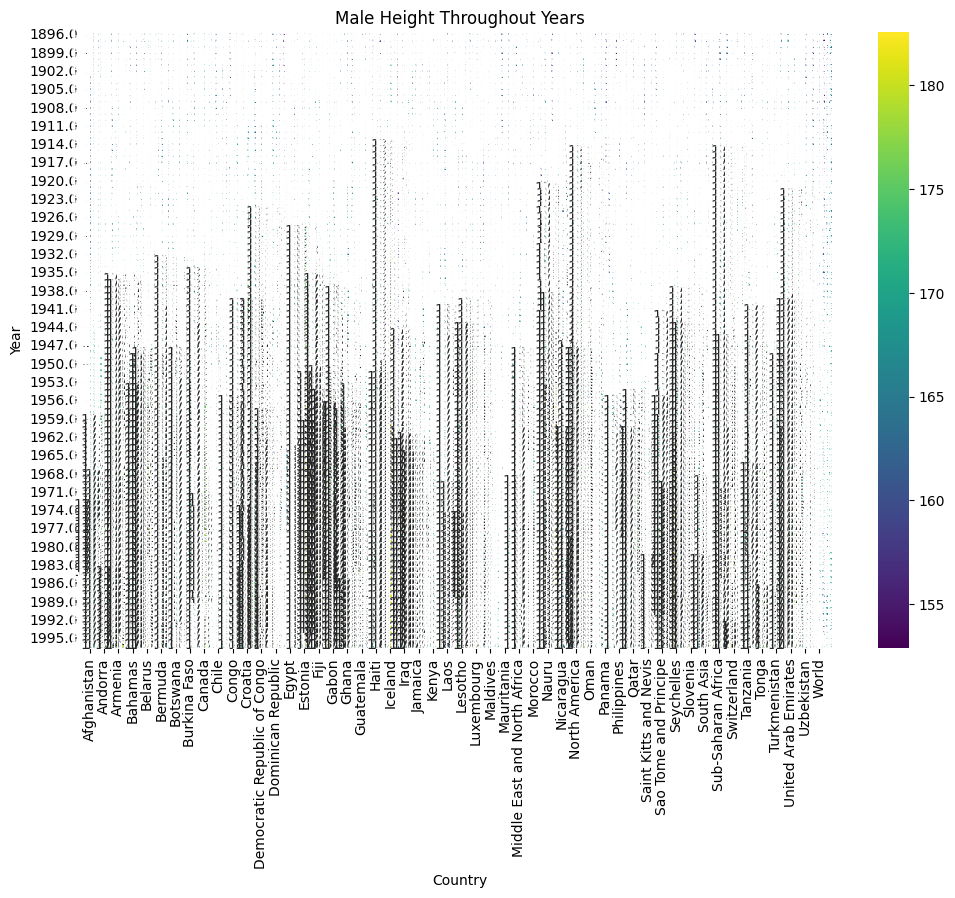

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

heatmap_data = data.pivot_table(index='Year', columns='Entity', values='Mean male height (cm)', aggfunc='mean')

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='viridis', annot=True, fmt=".1f", linewidths=.5)
plt.title("Male Height Throughout Years")
plt.xlabel("Country")
plt.ylabel("Year")
plt.show()



THis shows the AREA MAP for the MAle and FEmale Heights throught the YEAR 

In [73]:
areaplot = px.area(data,
              x='Year',
              color_discrete_sequence=px.colors.qualitative.Set2,
              y=['Mean male height (cm)', 'Mean female height (cm)'],
              labels={'value': 'Height (cm)', 'variable': 'Gender'},
              title='Male vs Female Heights Area Plot Over Time')
areaplot.show()



Plotly.express's colours . . .. . .
Diverging Scales:
px.colors.diverging.RdBu
px.colors.diverging.Picnic
px.colors.diverging.Portland
px.colors.diverging.Temps
Cyclical Scales:
px.colors.cyclical.IceFire
px.colors.cyclical.Plasma
px.colors.cyclical.Plotly
px.colors.cyclical.Viridis
Qualitative Scales:
px.colors.qualitative.Plotly
px.colors.qualitative.Safe
px.colors.qualitative.Set1
px.colors.qualitative.Set3
Sequential Scales:
px.colors.sequential.Agsunset
px.colors.sequential.Bluyl
px.colors.sequential.Viridis
px.colors.sequential.Plasma

In [67]:
scatterplot = px.scatter(data,
                 x='Mean male height (cm)',
                 y='Mean female height (cm)', 
                 color=data['Mean male height (cm)']-data['Mean female height (cm)'] , 
                 color_discrete_sequence=px.colors.sequential.Plasma,
                 animation_frame="Year" , 
                  size=data['Mean male height (cm)'] - data['Mean female height (cm)'] ,
                 labels={'Mean male height (cm)': 'Male Height (cm)', 'Mean female height (cm)': 'Female Height (cm)'},
                 title='Male vs Female Heights Scatter Plot Over Time',
                trendline="ols")
scatterplot.upate_layout(height=650)
scatterplot


DATA with no null values represented as Line plot of Male vs Female hEights 

In [87]:
lineplot = px.line(datanonull,
                   x='Year',
                   y=['Mean male height (cm)', 'Mean female height (cm)'],
                   color_discrete_sequence=[px.colors.sequential.Agsunset[0], px.colors.sequential.Agsunset[4]],
                   labels={'value': 'Height (cm)', 'variable': 'Gender'},
                   title='Male vs Female Heights Over Time',
                   )

lineplot



In [106]:
boxplot = px.box(datanonull,
             y=['Mean male height (cm)', 'Mean female height (cm)'],
             points="all",
             color_discrete_sequence=px.colors.cyclical.IceFire,
             labels={'value': 'Height (cm)', 'variable': 'Gender'},
             title='Male vs Female Heights Box Plot Over Time',
             animation_frame="Year")
boxplot

In [107]:
data.columns

Index(['Entity', 'Code', 'Year', 'Mean male height (cm)',
       'Mean female height (cm)', 'Year-on-year change in female height (%)',
       'Year-on-year change in male height (%)',
       'Population (historical estimates)',
       'Daily caloric intake per person that comes from animal protein'],
      dtype='object')

In [109]:
fig = px.line(datanonull, x='Year',
              y=['Mean male height (cm)', 'Mean female height (cm)'],
              color='Entity',
              labels={'value': 'Height (cm)', 'variable': 'Gender'},
              title='Effect of Daily Caloric Intake on Male and Female Heights Over Time')

fig.upate_layout(xaxis_title='Year',
                  yaxis_title='Height (cm)',
                  legend_title='Country')

fig


In [140]:
data['Daily caloric intake per person that comes from animal protein'] = p.to_numeric(data['Daily caloric intake per person that comes from animal protein'], errors='coerce')
data.replace([n.inf, -n.inf], n.nan, inplace=True)
mean_calories = data.groupby('Entity')['Daily caloric intake per person that comes from animal protein'].mean().reset_index()

mean_calories

,Entity,Daily caloric intake per person that comes from animal protein
0,Afghanistan,59.672116
1,Albania,48.872722
2,Algeria,94.275398
3,American Samoa,79.168402
4,Andorra,89.888667
...,...,...
203,Vietnam,198.061795
204,World,169.888743
205,Yemen,196.832953
206,Zambia,12.629910


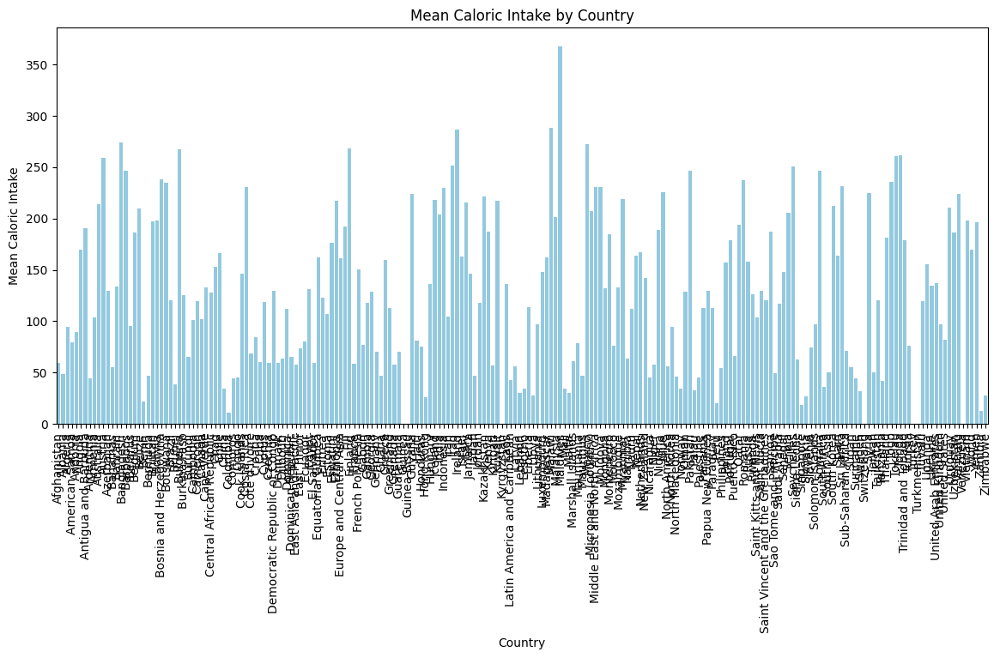

In [145]:
plt.figure(figsize=(14, 6))
sns.barplot(data=mean_calories, x='Entity', 
            y='Daily caloric intake per person that comes from animal protein',
            color='skyblue')
plt.title('Mean Caloric Intake by Country')
plt.xlabel('Country')
plt.ylabel('Mean Caloric Intake')
plt.xticks(rotation=90)
plt.show()

In [147]:
fig = px.scatter(mean_calories, x='Entity', y='Daily caloric intake per person that comes from animal protein', color='Entity',
                 labels={'Daily caloric intake per person that comes from animal protein': 'Mean Caloric Intake'},
                 title='Mean Caloric Intake by Country')

fig.upate_layout(xaxis_title='Country', yaxis_title='Mean Caloric Intake', xaxis_tickangle=-45)
fig

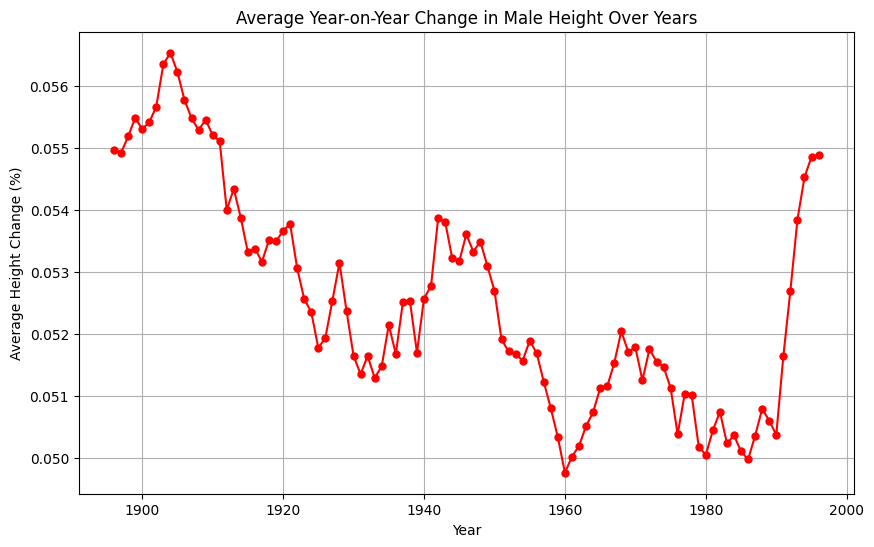

In [150]:
yearly_change = data.groupby('Year')['Year-on-year change in male height (%)'].mean()

# Plot the graph
plt.figure(figsize=(10, 6))
plt.plot(yearly_change.index, yearly_change.values, marker='o', markersize=5, color='red')
plt.title('Average Year-on-Year Change in Male Height Over Years')
plt.xlabel('Year')
plt.ylabel('Average Height Change (%)')
plt.grid(True)
plt.show()


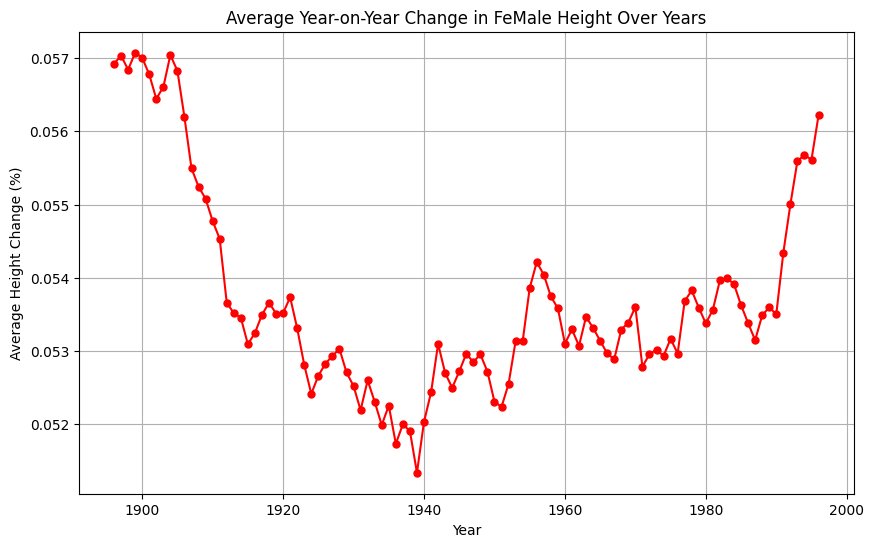

In [154]:
yearly_change = data.groupby('Year')['Year-on-year change in female height (%)'].mean()

# Plot the graph
plt.figure(figsize=(10, 6))
plt.plot(yearly_change.index, yearly_change.values, marker='o', markersize=5, color='red')
plt.title('Average Year-on-Year Change in FeMale Height Over Years')
plt.xlabel('Year')
plt.ylabel('Average Height Change (%)')
plt.grid(True)
plt.show()

In [182]:
# Assuming 'data' is your DataFrame
features = ['Daily caloric intake per person that comes from animal protein', 'Year-on-year change in female height (%)']
target = 'Mean female height (cm)'

# X = data[['Mean male height (cm)', 'Mean female height (cm)']]
# y_male = data['Mean male height (cm)']
# y_female = data['Mean female height (cm)']

# Select the features and target from the DataFrame
selected_columns = features + [target]
subset_data = data[selected_columns]

# Drop rows with missing values
subset_data = subset_data.dropna()

# Separate features (X) and target variable (y)
X = subset_data[features]
y = subset_data[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = [
    ('Linear Regression', LinearRegression()),
    ('Ridge Regression', Ridge()),
    ('Lasso Regression', Lasso()),
    ('Support Vector Regression', SVR()),
    ('Decision Tree', DecisionTreeRegressor()),
    ('Random Forest', RandomForestRegressor()),
    ('Gradient Boosting', GradientBoostingRegressor())
]
mse_scores = []
r_squared = []
for name, model in models:
    model.fit(X, y)
    y_pred = model.predict(X)
    
    mse = mean_squared_error(y, y_pred)
    r_squared = r2_score(y, y_pred)
    
    print(f"Model: {name}")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared: {r_squared}")
    print()

Model: Linear Regression
Mean Squared Error: 22.93658946927207
R-squared: 0.0005749465395169517

Model: Ridge Regression
Mean Squared Error: 22.936609241027153
R-squared: 0.0005740850170397049

Model: Lasso Regression
Mean Squared Error: 22.94930153743442
R-squared: 2.103858298452277e-05

Model: Support Vector Regression
Mean Squared Error: 22.837335130275253
R-squared: 0.004899794973978966

Model: Decision Tree
Mean Squared Error: 0.0
R-squared: 1.0

Model: Random Forest
Mean Squared Error: 2.669083394397894
R-squared: 0.8836989772297973

Model: Gradient Boosting
Mean Squared Error: 19.395701643932213
R-squared: 0.15486344740311864



In [179]:
x = n.array([[122, 0.01]])
x = x.reshape(1, -1)

for name, model in models:
    predicted_height = model.predict(x)
    print(f"Model: {name}")
    print(f'Predicted Height: {predicted_height[0]}')
    print()



Model: Linear Regression
Predicted Height: 157.03951167116034

Model: Ridge Regression
Predicted Height: 157.0355548246064

Model: Lasso Regression
Predicted Height: 156.93891335818665

Model: Support Vector Regression
Predicted Height: 157.45043587578422

Model: Decision Tree
Predicted Height: 154.4270072

Model: Random Forest
Predicted Height: 155.0118141090001

Model: Gradient Boosting
Predicted Height: 156.60042088636692



/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but Ridge was fitted with feature names

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but Lasso was fitted with feature names

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but SVR was fitted with feature names

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names

/Library/F

In [178]:
scores = cross_val_score(model, X, y, cv=5)  # X bağımsız değişkenleri temsil eder
print("Cross-Validation Scores:", scores)

Cross-Validation Scores: [-0.12135382 -0.11517889 -0.02451135 -0.03775062 -0.1140847 ]


In [195]:
mse_scores = []
r_squared_scores = []
model_names = []

scatter_data = p.DataFrame(columns=['Model', 'True Values', 'Predicted Values'])

for name, model in models:
    model.fit(X_train, y_train)  
    y_pred = model.predict(X_test) 
    
    mse = mean_squared_error(y_test, y_pred)
    r_squared = r2_score(y_test, y_pred)
    
    model_names.append(name)
    mse_scores.append(mse)
    r_squared_scores.append(r_squared)
    
    scatter_data = p.concat([scatter_data, 
                             p.DataFrame({'Model': [name] * len(y_test),
                                          
                                                           'True Values': y_test,
                                                           'Predicted Values': y_pred})])

# Create DataFrames for the scores
mse_df = p.DataFrame({'Model': model_names, 'MSE': mse_scores})
r_squared_df = p.DataFrame({'Model': model_names, 'R-squared': r_squared_scores})

# Plotting separate histograms for MSE and R-squared using Plotly
fig_mse = px.bar(mse_df, 
                 x='Model',
                 y='MSE', 
                 title='Model Comparison: Mean Squared Error (MSE)'
                 ,color_continuous_scale=px.colors.sequential.Plasma)
fig_r_squared = px.bar(r_squared_df, x='Model', y='R-squared', title='Model Comparison: R-squared')

# Scatter plot for True vs Predicted values
fig_scatter = px.scatter(scatter_data, x='True Values', y='Predicted Values', color='Model',
                         title='True vs Predicted Values by Model')

# Show the figures
fig_mse.show()
fig_r_squared.show()
fig_scatter.show()
